# Proyek Analisis Data: E-Commerce Public Dataset
- **Nama:** Abdul Azizur Rokhman
- **Email:** azizrokhman88@gmail.com
- **ID Dicoding:** abdul_azizur_rokhman

## Menentukan Pertanyaan Bisnis

- Kategori produk apa yang paling laris dan bagaimana kontribusinya terhadap total pendapatan?
- Apakah kecepatan pengiriman berpengaruh terhadap skor review dari customer?

## Import Semua Packages/Library yang Digunakan

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import folium
from shapely.geometry import Point, LineString

## Data Wrangling

### Gathering Data

Data Customer

In [ ]:
customer_fileid = "1ud7OTZCF4dcbB4TLk-8JC5KkJz3n8viC"
customer_url = f'https://drive.google.com/uc?export=download&id={customer_fileid}'

customer_df = pd.read_csv(customer_url)
customer_df.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


**Insight:**
- Terdapat kolom zip_code_prefix yang mana ini dapat digabungkan pada dataset Geolocation sehingga dapat mengetahui rata-rata kecepatan pengiriman dari lokasi customer
- Terdapat kolom city dan state, ini bisa dibuat untuk mengetahui banyaknya customer yang ada di kota/negara tersebut.

Data Geolocation

In [ ]:
geolocation_fileid = "1CWQg5RUwwdWUnD9Xnp3ZIzl2G_iimoc7"
geolocation_url = f'https://drive.google.com/uc?export=download&id={geolocation_fileid}'

geolocation_df = pd.read_csv(geolocation_url)
geolocation_df.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


**Insight:**
- Pada dataset ini, berisi data mengenai info setiap lokasi, ini bisa digabung dengan dataset Customer dan dataset Seller agar mengetahui lebih jelas letak customer berada sehingga dapat mengukur rata-rata kecepatan pengiriman pada lokasi seller ke lokasi customer

Data Order Items

In [ ]:
order_items_fileid = "1z7FDL1yzfrLkmQuwFvlV_zborjcIXeIx"
order_items_url = f'https://drive.google.com/uc?export=download&id={order_items_fileid}'

order_items_df = pd.read_csv(order_items_url)
order_items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


**Insight:**
- Kolom order_id dan seller_id bisa digunakan untuk mengetahui seller mana yang memiliki penjualan terbanyak dan kolom harga untuk penghasilan terbanyak
- Kolom product_id bisa untuk mengetahui produk mana yang sering dibeli

Data Order Payment

In [ ]:
order_payment_fileid = "1TFYgB3e00TzeY1Pn_q1EGavXDY7CJCeh"
order_payment_url = f'https://drive.google.com/uc?export=download&id={order_payment_fileid}'

order_payment_df = pd.read_csv(order_payment_url)
order_payment_df.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


**Insight:**
- Pada dataset ini, kita bisa mengetahui tipe pembayaran apa yang sering digunakan untuk membayar pembelian

Data Order Reviews

In [ ]:
order_reviews_fileid = "1rE7JbK9LqI8JHwxgTpduv1kjcOXguQRj"
order_reviews_url = f'https://drive.google.com/uc?export=download&id={order_reviews_fileid}'

order_reviews_df = pd.read_csv(order_reviews_url)
order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24
3,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06
4,f7c4243c7fe1938f181bec41a392bdeb,8e6bfb81e283fa7e4f11123a3fb894f1,5,NaN,Parabéns lojas lannister adorei comprar pela I...,2018-03-01 00:00:00,2018-03-02 10:26:53


**Insight:**
- Pada kolom review_score, dapat digunakan untuk melihat rata-rata skor review yang diberikan pada setiap produk yang diorder

Data Orders

In [ ]:
orders_fileid = "1PTGtGaonHTGzUqcqqSfz4a-fbNHmbL9q"
orders_url = f'https://drive.google.com/uc?export=download&id={orders_fileid}'

orders_df = pd.read_csv(orders_url)
orders_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


**Insight:**
- Pada dataset ini, rata-rata berisi kolom untuk jam pengiriman, jadi ini bisa dibuat untuk mengetahui kecepatan pengiriman dan kecepatan pengemasan

Data Product Category

In [ ]:
product_category_fileid = "14OshmOGJl0a-lVWQeGpPsjAsxKJ6w1Wv"
product_category_url = f'https://drive.google.com/uc?export=download&id={product_category_fileid}'

product_category_df = pd.read_csv(product_category_url)
product_category_df.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


**Insight:**
- tidak ada yang spesial dari dataset ini, hanya daftar kategori dari produk saja, mungkin bisa digabungkan dengan dataset produk agar saat divisualisasikan kita bisa mengetahui nama inggris dari kategori produk

Data Products

In [ ]:
products_fileid = "18PAmZYjQvzTK9keS6DLA1eriJhpDfk4v"
products_url = f'https://drive.google.com/uc?export=download&id={products_fileid}'

products_df = pd.read_csv(products_url)
products_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


**Insight:**
- Pada dataset ini tidak banyak yang spesial juga, hanya pada product_id ini yang bisa digabungkan dengan dataset order items untuk mengetahui produk apa saja yang sering dibeli, dan product_category_name yang bisa digabungkan dengan dataset product category untuk mengetahui nama inggrisnya

Data Sellers

In [ ]:
sellers_fileid = "1Sjcsw8fEnmOC69H4QjeJemUPBA6Hd-62"
sellers_url = f'https://drive.google.com/uc?export=download&id={sellers_fileid}'

sellers_df = pd.read_csv(sellers_url)
sellers_df.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ
3,c0f3eea2e14555b6faeea3dd58c1b1c3,4195,sao paulo,SP
4,51a04a8a6bdcb23deccc82b0b80742cf,12914,braganca paulista,SP


**Insight:**
- Pada kolom seller_id, ini bisa digunakan untuk mengetahui seller mana yang memiliki penjualan dan penghasilan terbanyak
- Pada kolom lokasi, ini bisa digunakan untuk mengetahui kecepatan pengiriman dari lokasi seller ke lokasi customer

### Assessing Data

Data Customer

In [ ]:
customer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [ ]:
print("Jumlah duplikasi: ", customer_df.duplicated().sum())

Jumlah duplikasi:  0


In [ ]:
customer_df['customer'] = range(1, len(customer_df) + 1)

customer = customer_df.pop('customer')
customer_df.insert(1, 'customer', customer)

**Insight:**
- Saya menambahkan kolom customer agar nanti pada visualisasi data, yang muncul adalah nomor dari customer, bukan customer_id nya, agar tidak terlalu panjang pada visualisasi
- selain itu, saya lihat tidak ada masalah apapun pada dataset ini

Data Geolocation

In [ ]:
geolocation_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000163 entries, 0 to 1000162
Data columns (total 5 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   geolocation_zip_code_prefix  1000163 non-null  int64  
 1   geolocation_lat              1000163 non-null  float64
 2   geolocation_lng              1000163 non-null  float64
 3   geolocation_city             1000163 non-null  object 
 4   geolocation_state            1000163 non-null  object 
dtypes: float64(2), int64(1), object(2)
memory usage: 38.2+ MB


In [ ]:
print("Jumlah duplikasi: ", geolocation_df.duplicated().sum())
geolocation_df.describe()

Jumlah duplikasi:  261831


,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
count,1.000163e+06,1.000163e+06,1.000163e+06
mean,3.657417e+04,-2.117615e+01,-4.639054e+01
std,3.054934e+04,5.715866e+00,4.269748e+00
min,1.001000e+03,-3.660537e+01,-1.014668e+02
25%,1.107500e+04,-2.360355e+01,-4.857317e+01
50%,2.653000e+04,-2.291938e+01,-4.663788e+01
75%,6.350400e+04,-1.997962e+01,-4.376771e+01
max,9.999000e+04,4.506593e+01,1.211054e+02


**Insight:**
- Pada data geolocation, terdapat banyak sekali data yang duplikat

Data Order Items

In [ ]:
order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [ ]:
print("Jumlah duplikasi: ", order_items_df.duplicated().sum())
order_items_df.describe()

Jumlah duplikasi:  0


,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


**Insight:**
- Terdapat masalah kesalahan tipe data pada kolom shipping_limit_date yang mana pada dataset ini bertipe object, tetapi seharusnya bertipe datetime

Data Order Payment

In [ ]:
order_payment_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [ ]:
print("Jumlah duplikasi: ", order_payment_df.duplicated().sum())
order_payment_df.describe()

Jumlah duplikasi:  0


,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


**Insight:**
- Pada kolom payment_value, nilai minimumnya adalah 0.00, sepertinya ini dikarenakan pembayaran yang tidak jadi

Data Order Reviews

In [ ]:
order_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   review_id                99224 non-null  object
 1   order_id                 99224 non-null  object
 2   review_score             99224 non-null  int64 
 3   review_comment_title     11568 non-null  object
 4   review_comment_message   40977 non-null  object
 5   review_creation_date     99224 non-null  object
 6   review_answer_timestamp  99224 non-null  object
dtypes: int64(1), object(6)
memory usage: 5.3+ MB


In [ ]:
order_reviews_df.isna().sum()

,0
review_id,0
order_id,0
review_score,0
review_comment_title,87656
review_comment_message,58247
review_creation_date,0
review_answer_timestamp,0


In [ ]:
print("Jumlah duplikasi: ", order_reviews_df.duplicated().sum())
order_reviews_df.describe()

Jumlah duplikasi:  0


,review_score
count,99224.000000
mean,4.086421
std,1.347579
min,1.000000
25%,4.000000
50%,5.000000
75%,5.000000
max,5.000000


**Insight:**
- Ada missing value pada kolom review_comment_title dan review_comment_message, tetapi mungkin ini tidak terlalu berpengaruh pada analisis nanti dikarenakan ini hanya komen yang diberikan pembeli pada produk yang dibeli, bukan skor review yang diberikan.

Data Orders

In [ ]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


In [ ]:
orders_df.isna().sum()

,0
order_id,0
customer_id,0
order_status,0
order_purchase_timestamp,0
order_approved_at,160
order_delivered_carrier_date,1783
order_delivered_customer_date,2965
order_estimated_delivery_date,0


In [ ]:
print("Jumlah duplikasi: ", orders_df.duplicated().sum())
orders_df.describe()

Jumlah duplikasi:  0


,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,99441,99441,99441,99441,99281,97658,96476,99441
unique,99441,99441,8,98875,90733,81018,95664,459
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2018-04-11 10:48:14,2018-02-27 04:31:10,2018-05-09 15:48:00,2018-05-08 23:38:46,2017-12-20 00:00:00
freq,1,1,96478,3,9,47,3,522


**Insight:**
- Terdapat kesalahan tipe data pada kolom order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, dan order_estimated_delivery_date yang seharusnya adalah datetime
- Terdapat missing value pada kolom order_approved_at, order_delivered_carrier_date, dan order_delivered_customer_date. Hal ini kemungkinan dikarenakan pesanan yang dilakukan, dibatalkan oleh pembeli

Data Product Category

In [ ]:
product_category_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [ ]:
print("Jumlah duplikasi: ", product_category_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:**
- Pada dataset ini aman, tidak ada masalah missing value, salah tipedata maupun duplikat data

Data Products

In [ ]:
products_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


In [ ]:
products_df.isna().sum()

,0
product_id,0
product_category_name,610
product_name_lenght,610
product_description_lenght,610
product_photos_qty,610
product_weight_g,2
product_length_cm,2
product_height_cm,2
product_width_cm,2


In [ ]:
print("Jumlah duplikasi: ", products_df.duplicated().sum())
products_df.describe()

Jumlah duplikasi:  0


,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
count,32341.000000,32341.000000,32341.000000,32949.000000,32949.000000,32949.000000,32949.000000
mean,48.476949,771.495285,2.188986,2276.472488,30.815078,16.937661,23.196728
std,10.245741,635.115225,1.736766,4282.038731,16.914458,13.637554,12.079047
min,5.000000,4.000000,1.000000,0.000000,7.000000,2.000000,6.000000
25%,42.000000,339.000000,1.000000,300.000000,18.000000,8.000000,15.000000
50%,51.000000,595.000000,1.000000,700.000000,25.000000,13.000000,20.000000
75%,57.000000,972.000000,3.000000,1900.000000,38.000000,21.000000,30.000000
max,76.000000,3992.000000,20.000000,40425.000000,105.000000,105.000000,118.000000


**Insight:**
- Ada masalah missing value pada deskripsi produknya, nanti coba saya lihat apakah ada yang melakukan pembelian pada produk tersebut atau tidak.
- Pada kolom product_weight_g, terdapat produk yang memiliki berat 0g

Data Sellers

In [ ]:
sellers_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


In [ ]:
print("Jumlah duplikasi: ", sellers_df.duplicated().sum())
sellers_df.describe()

Jumlah duplikasi:  0


,seller_zip_code_prefix
count,3095.000000
mean,32291.059451
std,32713.453830
min,1001.000000
25%,7093.500000
50%,14940.000000
75%,64552.500000
max,99730.000000


In [ ]:
sellers_df['seller'] = range(1, len(sellers_df) + 1)

seller = sellers_df.pop('seller')
sellers_df.insert(1, 'seller', seller)

**Insight:**
- Disini saya ingin menambahkan kolom baru yang digunakan agar nanti saat visualisasi bisa ditampilkan nomornya saja, karena jika yang ditampilkan id nya, itu akan panjang sekali
- Pada dataset ini tidak ada masalah sama sekali

### Cleaning Data

Data Geolocation

In [ ]:
geolocation_df.drop_duplicates(inplace=True)
print("Jumlah duplikasi: ", geolocation_df.duplicated().sum())

Jumlah duplikasi:  0


**Insight:**
- Data duplikat pada dataset Geolocation sudah berhasil diatasi dengan cara menghapus data duplikat tersebut, walau jumlahnya cukup banyak

Data Order Items

In [ ]:
for column in ['shipping_limit_date']:
  order_items_df[column] = pd.to_datetime(order_items_df[column])

order_items_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


**Insight:**
- Permasalahan tipe data pada dataset order items sudah berhasil ditangani dengan merubah tipe data object ke tipe data datetime

Data Order Payment

In [ ]:
order_payment_df[order_payment_df.payment_value == order_payment_df.payment_value.min()]

,order_id,payment_sequential,payment_type,payment_installments,payment_value
19922,8bcbe01d44d147f901cd3192671144db,4,voucher,1,0.0
36822,fa65dad1b0e818e3ccc5cb0e39231352,14,voucher,1,0.0
43744,6ccb433e00daae1283ccc956189c82ae,4,voucher,1,0.0
51280,4637ca194b6387e2d538dc89b124b0ee,1,not_defined,1,0.0
57411,00b1cb0320190ca0daa2c88b35206009,1,not_defined,1,0.0
62674,45ed6e85398a87c253db47c2d9f48216,3,voucher,1,0.0
77885,fa65dad1b0e818e3ccc5cb0e39231352,13,voucher,1,0.0
94427,c8c528189310eaa44a745b8d9d26908b,1,not_defined,1,0.0
100766,b23878b3e8eb4d25a158f57d96331b18,4,voucher,1,0.0


In [ ]:
order_payment_df.drop(index=order_payment_df[order_payment_df['payment_value'] == 0.0].index, inplace=True)

**Insight:**
- Dikarenakan data payment_value 0.0 ini kemungkinan dikarenakan pembayaran yang tidak jadi dan hanya sedikit jumlahnya, jadi saya hapus saja untuk data yang memiliki payment_value 0.0
- Masalah data 0.0 sudah teratasi dengan menghapus data payment_value yang berisi 0.0 dikarenakan jumlahnya data yang sedikit

Data Orders

In [ ]:
orders_df[orders_df.order_approved_at.isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
1130,00b1cb0320190ca0daa2c88b35206009,3532ba38a3fd242259a514ac2b6ae6b6,canceled,2018-08-28 15:26:39,NaN,NaN,NaN,2018-09-12 00:00:00
1801,ed3efbd3a87bea76c2812c66a0b32219,191984a8ba4cbb2145acb4fe35b69664,canceled,2018-09-20 13:54:16,NaN,NaN,NaN,2018-10-17 00:00:00
1868,df8282afe61008dc26c6c31011474d02,aa797b187b5466bc6925aaaa4bb3bed1,canceled,2017-03-04 12:14:30,NaN,NaN,NaN,2017-04-10 00:00:00
2029,8d4c637f1accf7a88a4555f02741e606,b1dd715db389a2077f43174e7a675d07,canceled,2018-08-29 16:27:49,NaN,NaN,NaN,2018-09-13 00:00:00
2161,7a9d4c7f9b068337875b95465330f2fc,7f71ae48074c0cfec9195f88fcbfac55,canceled,2017-05-01 16:12:39,NaN,NaN,NaN,2017-05-30 00:00:00
...,...,...,...,...,...,...,...,...
97696,5a00b4d35edffc56b825c3646a99ba9d,6a3bdf004ca96338fb5fad1b8d93c2e6,canceled,2017-07-02 15:38:46,NaN,NaN,NaN,2017-07-25 00:00:00
98415,227c804e2a44760671a6a5697ea549e4,62e7477e75e542243ee62a0ba73f410f,canceled,2017-09-28 15:02:56,NaN,NaN,NaN,2017-10-16 00:00:00
98909,e49e7ce1471b4693482d40c2bd3ad196,e4e7ab3f449aeb401f0216f86c2104db,canceled,2018-08-07 11:16:28,NaN,NaN,NaN,2018-08-10 00:00:00
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaN,NaN,NaN,2018-10-01 00:00:00


In [ ]:
orders_df[orders_df.order_delivered_carrier_date.isna()]
# Terdapat 2 data yang status ordernya sudah invoiced, tetapi order deliver date nya NaN

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaN,NaN,2018-08-21 00:00:00
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaN,NaN,2017-10-03 00:00:00
266,8e24261a7e58791d10cb1bf9da94df5c,64a254d30eed42cd0e6c36dddb88adf0,unavailable,2017-11-16 15:09:28,2017-11-16 15:26:57,NaN,NaN,2017-12-05 00:00:00
324,d3c8851a6651eeff2f73b0e011ac45d0,957f8e082185574de25992dc659ebbc0,processing,2016-10-05 22:44:13,2016-10-06 15:51:05,NaN,NaN,2016-12-09 00:00:00
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaN,NaN,NaN,2018-10-01 00:00:00
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaN,NaN,2018-02-06 00:00:00
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaN,NaN,NaN,2018-09-27 00:00:00
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaN,NaN,2017-09-15 00:00:00


In [ ]:
orders_df[orders_df.order_delivered_customer_date.isna()]
# Terdapat 4 Data juga disini

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaN,NaN,2017-05-09 00:00:00
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaN,2018-06-28 00:00:00
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaN,NaN,2018-08-21 00:00:00
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaN,NaN,2017-10-03 00:00:00
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaN,2018-02-07 00:00:00
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaN,NaN,NaN,2018-10-01 00:00:00
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaN,NaN,2018-02-06 00:00:00
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaN,NaN,NaN,2018-09-27 00:00:00
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaN,NaN,2017-09-15 00:00:00


In [ ]:
orders_df.dropna(axis=0, inplace=True)

In [ ]:
for column in ['order_purchase_timestamp','order_approved_at','order_delivered_carrier_date','order_delivered_customer_date','order_estimated_delivery_date']:
  orders_df[column] = pd.to_datetime(orders_df[column])

In [ ]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96461 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96461 non-null  object        
 1   customer_id                    96461 non-null  object        
 2   order_status                   96461 non-null  object        
 3   order_purchase_timestamp       96461 non-null  datetime64[ns]
 4   order_approved_at              96461 non-null  datetime64[ns]
 5   order_delivered_carrier_date   96461 non-null  datetime64[ns]
 6   order_delivered_customer_date  96461 non-null  datetime64[ns]
 7   order_estimated_delivery_date  96461 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.6+ MB


**Insight:**
- Permasalahan kesalahan tipe data sudah berhasil diatasi dengan mengubah tipe data object ke datetime
- Setelah saya analisa, sepertinya data-data missing value ini rata-rata adalah data pemesanan yang dibatalkan. Permasalahan missing value pada dataset orders berhasil diatasi dengan cara menghapus seluruh data missing value dikarenakan rata-rata data dari missing value ini tidak terlalu memiliki informasi penting untuk analisis nanti

Data Products

In [ ]:
products_df[products_df.product_category_name.isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


In [ ]:
# saya coba untuk cek di data order item, apakah ada atau tidak data tersebut

order_items_df[order_items_df.product_id == 'a41e356c76fab66334f36de622ecbd3a']

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
81289,b8bfa12431142333a0c84802f9529d87,2,a41e356c76fab66334f36de622ecbd3a,d9cb0052a666de5308b32f32ad5f1b1c,2018-01-25 09:08:37,99.3,7.77


In [ ]:
products_df['product_category_name'].fillna(value='empty', inplace=True)

<ipython-input-46-636633da0621>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  products_df['product_category_name'].fillna(value='empty', inplace=True)


In [ ]:
products_df.fillna(value=0, inplace=True)

In [ ]:
products_df[products_df.product_category_name == 'empty']

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,empty,0.0,0.0,0.0,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,empty,0.0,0.0,0.0,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,empty,0.0,0.0,0.0,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,empty,0.0,0.0,0.0,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,empty,0.0,0.0,0.0,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,empty,0.0,0.0,0.0,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,empty,0.0,0.0,0.0,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,empty,0.0,0.0,0.0,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,empty,0.0,0.0,0.0,1300.0,45.0,16.0,45.0


**Insight:**
- Dikarenakan pada data missing value terdapat order yang dilakukan, maka saya mengubah untuk isi dari product_category_name menjadi "empty", dan untuk product_name_lenght, product_description_lenght, dan product_photos_qty menjadi 0
- Masalah missing value pada data products sudah berhasil diatasi dengan cara mengubah isi dari product_category_name menjadi "empty", dan untuk product_name_lenght, product_description_lenght, dan product_photos_qty menjadi 0 dikarenakan data missing value tersebut sudah ada pengorderan yang dilakukan, jadi agak sayang jika di hapus

## Exploratory Data Analysis (EDA)

### Explore Data Customer

In [ ]:
customer_df.describe(include="all")

,customer_id,customer,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441.000000,99441,99441.000000,99441,99441
unique,99441,NaN,96096,NaN,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,NaN,8d50f5eadf50201ccdcedfb9e2ac8455,NaN,sao paulo,SP
freq,1,NaN,17,NaN,15540,41746
mean,NaN,49721.000000,NaN,35137.474583,NaN,NaN
std,NaN,28706.288396,NaN,29797.938996,NaN,NaN
min,NaN,1.000000,NaN,1003.000000,NaN,NaN
25%,NaN,24861.000000,NaN,11347.000000,NaN,NaN
50%,NaN,49721.000000,NaN,24416.000000,NaN,NaN
75%,NaN,74581.000000,NaN,58900.000000,NaN,NaN


In [ ]:
# saya ingin mengecek jumlah customer pada setiap kota dan kota mana yang memiliki customer terbanyak
customer_df.groupby(by="customer_city").customer_id.nunique().sort_values(ascending=False)

,customer_id
customer_city,
sao paulo,15540
rio de janeiro,6882
belo horizonte,2773
brasilia,2131
curitiba,1521
...,...
ibiara,1
rio espera,1
rio dos indios,1


In [ ]:
# saya coba cek juga untuk yang state
customer_df.groupby(by="customer_state").customer_id.nunique().sort_values(ascending=False)

,customer_id
customer_state,
SP,41746
RJ,12852
MG,11635
RS,5466
PR,5045
SC,3637
BA,3380
DF,2140
ES,2033


**Insight:**
- Kota yang memiliki customer terbanyak adalah kota sao paulo dan negara yang memiliki customer terbanyak adalah negara SP

### Explore Data Geolocation

In [ ]:
geolocation_df.describe(include="all")

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
count,738332.000000,738332.000000,738332.000000,738332,738332
unique,NaN,NaN,NaN,8011,27
top,NaN,NaN,NaN,sao paulo,SP
freq,NaN,NaN,NaN,79927,285976
mean,38316.086800,-20.998353,-46.461098,NaN,NaN
std,30632.496675,5.892315,4.393705,NaN,NaN
min,1001.000000,-36.605374,-101.466766,NaN,NaN
25%,12600.000000,-23.603061,-48.867822,NaN,NaN
50%,29144.000000,-22.873588,-46.647278,NaN,NaN
75%,65950.000000,-19.923336,-43.836974,NaN,NaN


In [ ]:
sellers_loc_df = sellers_df.merge(geolocation_df.rename(columns={'geolocation_zip_code_prefix': 'seller_zip_code_prefix',
                                     'geolocation_lat': 'seller_lat',
                                     'geolocation_lng': 'seller_lng'}),
              on='seller_zip_code_prefix', how='left')

sellers_loc_df = (
    sellers_loc_df.groupby('seller_id', as_index=False)
    .agg(
        lat=('seller_lat', 'mean'),
        lon=('seller_lng', 'mean'),
        zip_code_prefix=('seller_zip_code_prefix', 'first'),  # Contoh kolom tambahan
        seller=('seller', 'first'),
        seller_city=('seller_city', 'first')
    )
)

sellers_loc_df = (
    sellers_loc_df.groupby('seller_city', as_index=False)
    .agg(
        seller_id=('seller_id', 'first'),
        lat=('lat', 'mean'),
        lon=('lon', 'mean'),
        zip_code_prefix=('zip_code_prefix', 'first'),  # Contoh kolom tambahan
        seller=('seller', 'first')
    )
)

sellers_loc_df.head()

,seller_city,seller_id,lat,lon,zip_code_prefix,seller
0,04482255,ceb7b4fb9401cd378de7886317ad1b47,-23.013945,-43.463020,22790,518
1,abadia de goias,c8143b3069f6746a77421b5ce30a450c,-16.767161,-49.438178,75345,2068
2,afonso claudio,2f4b9d112bfa44a214bc6cef085d17c8,-20.076743,-41.123686,29600,2154
3,aguas claras df,3a52d63a8f9daf5a28f3626d7eb9bd28,-15.832887,-48.029378,71900,2590
4,alambari,717b78b0950b51ed00b1471d858b0edc,-23.561571,-47.885101,18220,2116


In [ ]:
customer_loc_df = customer_df.merge(geolocation_df.rename(columns={'geolocation_zip_code_prefix': 'customer_zip_code_prefix',
                                     'geolocation_lat': 'customer_lat',
                                     'geolocation_lng': 'customer_lng'}),
              on='customer_zip_code_prefix', how='left')

customer_loc_df = (
    customer_loc_df.groupby('customer_id', as_index=False)
    .agg(
        lat=('customer_lat', 'mean'),
        lon=('customer_lng', 'mean'),
        zip_code_prefix=('customer_zip_code_prefix', 'first'),  # Contoh kolom tambahan
        customer=('customer', 'first'),
        customer_city=('customer_city', 'first')
    )
)

customer_loc_df = (
    customer_loc_df.groupby('customer_city', as_index=False)
    .agg(
        customer_id=('customer_id', 'first'),
        lat=('lat', 'mean'),
        lon=('lon', 'mean'),
        zip_code_prefix=('zip_code_prefix', 'first'),  # Contoh kolom tambahan
        customer=('customer', 'first')
    )
)

customer_loc_df.head()

,customer_city,customer_id,lat,lon,zip_code_prefix,customer
0,abadia dos dourados,9e01f714a2b3b8962c222cf2b74c20dc,-18.477752,-47.406319,38540,74530
1,abadiania,576d71ddb21b21763cfedce73b902180,-16.193718,-48.709452,72940,42308
2,abaete,08528824266cd0720658ff01df662b6a,-19.158364,-45.446897,35620,61141
3,abaetetuba,305f736d2711641a06f6a9c9bd837b00,-1.723644,-48.881349,68440,11201
4,abaiara,9723d86b12bdec025be4c43f71b0ba52,-7.355970,-39.043267,63240,69826


**Insight:**
- Pada data geolocation, saya gabungkan dengan data customer dan seller untuk pembuatan analisis geospatial nanti dengan menyamakan zip codenya lalu mengambil rata-rata dari lat dan lng nya agar tidak ada duplikasi pada customer/seller, lalu saya mengambil rata-rata lagi dari kota seller/customer agar tidak banyak poin-poin pada kota yang sama sehingga visualisasi map akan lebih ringan

### Explore Data Order Items

In [ ]:
order_items_df.describe(include="all")

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
count,112650,112650.000000,112650,112650,112650,112650.000000,112650.000000
unique,98666,NaN,32951,3095,NaN,NaN,NaN
top,8272b63d03f5f79c56e9e4120aec44ef,NaN,aca2eb7d00ea1a7b8ebd4e68314663af,6560211a19b47992c3666cc44a7e94c0,NaN,NaN,NaN
freq,21,NaN,527,2033,NaN,NaN,NaN
mean,NaN,1.197834,NaN,NaN,2018-01-07 15:36:52.192685312,120.653739,19.990320
min,NaN,1.000000,NaN,NaN,2016-09-19 00:15:34,0.850000,0.000000
25%,NaN,1.000000,NaN,NaN,2017-09-20 20:57:27.500000,39.900000,13.080000
50%,NaN,1.000000,NaN,NaN,2018-01-26 13:59:35,74.990000,16.260000
75%,NaN,1.000000,NaN,NaN,2018-05-10 14:34:00.750000128,134.900000,21.150000
max,NaN,21.000000,NaN,NaN,2020-04-09 22:35:08,6735.000000,409.680000


In [ ]:
order_items_df = order_items_df.merge(
    products_df[['product_id', 'product_category_name']],
    on="product_id",
    how="left"
)

order_items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,moveis_decoracao
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumaria
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ferramentas_jardim


In [ ]:
order_items_df = order_items_df.merge(
    sellers_df[['seller_id', 'seller']],
    on="seller_id",
    how="left"
)

order_items_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,seller
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29,cool_stuff,514
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93,pet_shop,472
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87,moveis_decoracao,1825
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79,perfumaria,2024
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14,ferramentas_jardim,1598


In [ ]:
order_items_df.groupby(by="product_category_name").product_id.nunique().sort_values(ascending=False)

,product_id
product_category_name,
cama_mesa_banho,3029
esporte_lazer,2867
moveis_decoracao,2657
beleza_saude,2444
utilidades_domesticas,2335
...,...
casa_conforto_2,5
fashion_roupa_infanto_juvenil,5
pc_gamer,3


In [ ]:
order_items_df.groupby(by="product_category_name").price.max().sort_values(ascending=False)

,price
product_category_name,
utilidades_domesticas,6735.00
pcs,6729.00
artes,6499.00
eletroportateis,4799.00
instrumentos_musicais,4399.87
...,...
seguros_e_servicos,183.29
fraldas_higiene,139.89
fashion_roupa_infanto_juvenil,110.00


In [ ]:
order_items_df.groupby(by="seller").order_id.nunique().sort_values(ascending=False)

,order_id
seller,
798,1854
2464,1806
1414,1706
475,1404
1874,1314
...,...
1774,1
1775,1
1781,1


In [ ]:
order_items_df.groupby(by="seller").price.sum().sort_values(ascending=False)

,price
seller,
2618,229472.63
902,222776.05
2464,200472.92
558,194042.03
1183,187923.89
...,...
138,8.00
2415,7.60
2099,6.90


**Insight:**
- Disini bisa mendapatkan cukup banyak informasi dengan menggabungkan kolom dari data product dan kolom dari data seller ke data order_items, disini untuk kategori produk yang memiliki penjualan paling banyak adalah cama mesa banho, dan untuk produk yang memiliki harga tertinggi adalah utilidades domesticas
- Lalu untuk penjual yang memiliki penjualan terbanyak ada pada penjual ke 798, dan penjual yang memiliki revenue tertinggi ada pada penjual ke 2618

### Explore Data Order Payment

In [ ]:
order_payment_df.describe(include="all")

,order_id,payment_sequential,payment_type,payment_installments,payment_value
count,103877,103877.000000,103877,103877.000000,103877.000000
unique,99437,NaN,4,NaN,NaN
top,fa65dad1b0e818e3ccc5cb0e39231352,NaN,credit_card,NaN,NaN
freq,27,NaN,76795,NaN,NaN
mean,NaN,1.092340,NaN,2.853509,154.113732
std,NaN,0.704312,NaN,2.687112,217.498755
min,NaN,1.000000,NaN,0.000000,0.010000
25%,NaN,1.000000,NaN,1.000000,56.820000
50%,NaN,1.000000,NaN,1.000000,100.000000
75%,NaN,1.000000,NaN,4.000000,171.840000


In [ ]:
order_payment_df.groupby(by="payment_type").order_id.nunique().sort_values(ascending=False)

,order_id
payment_type,
credit_card,76505
boleto,19784
voucher,3866
debit_card,1528


In [ ]:
order_payment_df.groupby(by="payment_installments").order_id.nunique().sort_values(ascending=False)

,order_id
payment_installments,
1,49057
2,12389
3,10443
4,7088
10,5315
5,5234
8,4253
6,3916
7,1623


**Insight:**
- Pembayaran terbanyak adalah 13664.080000, dan untuk tipe pembayaran terbanyak adalah menggunakan credit card
- Lalu untuk cicilan/payment_installments, ternyata banyak yang membayar pembelian dengan sekali bayar

### Explore Data Order Reviews

In [ ]:
order_reviews_df.describe(include="all")

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
count,99224,99224,99224.000000,11568,40977,99224,99224
unique,98410,98673,NaN,4527,36159,636,98248
top,7b606b0d57b078384f0b58eac1d41d78,c88b1d1b157a9999ce368f218a407141,NaN,Recomendo,Muito bom,2017-12-19 00:00:00,2017-06-15 23:21:05
freq,3,3,NaN,423,230,463,4
mean,NaN,NaN,4.086421,NaN,NaN,NaN,NaN
std,NaN,NaN,1.347579,NaN,NaN,NaN,NaN
min,NaN,NaN,1.000000,NaN,NaN,NaN,NaN
25%,NaN,NaN,4.000000,NaN,NaN,NaN,NaN
50%,NaN,NaN,5.000000,NaN,NaN,NaN,NaN
75%,NaN,NaN,5.000000,NaN,NaN,NaN,NaN


In [ ]:
order_reviews_df = order_reviews_df.merge(
    order_items_df[['order_id', 'product_id', 'product_category_name']],
    on="order_id",
    how="left"
)

order_reviews_df.head()

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,product_id,product_category_name
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59,fd25ab760bfbba13c198fa3b4f1a0cd3,esporte_lazer
1,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59,fd25ab760bfbba13c198fa3b4f1a0cd3,esporte_lazer
2,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13,be0dbdc3d67d55727a65d4cd696ca73c,informatica_acessorios
3,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24,d1c427060a0f73f6b889a5c7c61f2ac4,informatica_acessorios
4,e64fb393e7b32834bb789ff8bb30750e,658677c97b385a9be170737859d3511b,5,NaN,Recebi bem antes do prazo estipulado.,2017-04-21 00:00:00,2017-04-21 22:02:06,52c80cedd4e90108bf4fa6a206ef6b03,ferramentas_jardim


In [ ]:
review_stats = order_reviews_df.groupby("product_category_name").agg(
    average_score=('review_score', 'mean'),
    total_reviews=('review_score', 'count')
).sort_values(by="average_score", ascending=False)

print(review_stats)

                                               average_score  total_reviews
product_category_name                                                      
cds_dvds_musicais                                   4.642857             14
fashion_roupa_infanto_juvenil                       4.500000              8
livros_interesse_geral                              4.446266            549
construcao_ferramentas_ferramentas                  4.444444             99
flores                                              4.419355             31
...                                                      ...            ...
moveis_escritorio                                   3.493183           1687
pc_gamer                                            3.333333              9
portateis_cozinha_e_preparadores_de_alimentos       3.266667             15
fraldas_higiene                                     3.256410             39
seguros_e_servicos                                  2.500000              2

[74 rows x 

In [ ]:
review_stats = order_reviews_df.groupby("product_category_name").agg(
    average_score=('review_score', 'mean'),
    total_reviews=('review_score', 'count')
).sort_values(by="total_reviews", ascending=False)

print(review_stats)

                               average_score  total_reviews
product_category_name                                      
cama_mesa_banho                     3.895663          11137
beleza_saude                        4.142768           9645
esporte_lazer                       4.107986           8640
moveis_decoracao                    3.903493           8331
informatica_acessorios              3.930819           7849
...                                      ...            ...
cds_dvds_musicais                   4.642857             14
la_cuisine                          4.000000             13
pc_gamer                            3.333333              9
fashion_roupa_infanto_juvenil       4.500000              8
seguros_e_servicos                  2.500000              2

[74 rows x 2 columns]


**Insight:**
- Disini bisa mendapatkan informasi mengenai skor review setiap produk, produk yang memiliki skor review tertinggi adalah cds dvd musicais tetapi memiliki total review yang sedikit yaitu 14 saja, untuk produk yang memiliki review terbanyak adalah cama mesa banho tetapi memiliki skor review yang tengah-tengah yaitu 3.9, mungkin dari penglihatan saya produk yang memiliki skor review tertinggi serta total review terbanyak adalah produk beleza saude dengan skor review 4.1 dengan total review 9645

### Explore Data Orders

In [ ]:
orders_df.describe(include="all")

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
count,96461,96461,96461,96461,96461,96461,96461,96461
unique,96461,96461,2,NaN,NaN,NaN,NaN,NaN
top,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,NaN,NaN,NaN,NaN,NaN
freq,1,1,96455,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,2018-01-01 23:53:26.642249216,2018-01-02 10:10:06.480142336,2018-01-05 05:21:04.508827392,2018-01-14 13:17:13.228102400,2018-01-25 17:33:14.236012544
min,NaN,NaN,NaN,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00
25%,NaN,NaN,NaN,2017-09-14 09:28:28,2017-09-14 14:30:14,2017-09-18 16:52:19,2017-09-25 22:31:59,2017-10-05 00:00:00
50%,NaN,NaN,NaN,2018-01-20 19:59:42,2018-01-22 13:49:00,2018-01-24 16:19:03,2018-02-02 19:50:56,2018-02-16 00:00:00
75%,NaN,NaN,NaN,2018-05-05 18:33:24,2018-05-06 10:30:49,2018-05-08 14:33:00,2018-05-15 23:08:54,2018-05-28 00:00:00
max,NaN,NaN,NaN,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00


In [ ]:
orders_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96461 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       96461 non-null  object        
 1   customer_id                    96461 non-null  object        
 2   order_status                   96461 non-null  object        
 3   order_purchase_timestamp       96461 non-null  datetime64[ns]
 4   order_approved_at              96461 non-null  datetime64[ns]
 5   order_delivered_carrier_date   96461 non-null  datetime64[ns]
 6   order_delivered_customer_date  96461 non-null  datetime64[ns]
 7   order_estimated_delivery_date  96461 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.6+ MB


In [ ]:
delivery_speed = orders_df["order_delivered_customer_date"] - orders_df["order_delivered_carrier_date"]
delivery_speed = delivery_speed.apply(lambda x: x.total_seconds())
orders_df["delivery_speed"] = round(delivery_speed/86400)
orders_df.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed
count,96461,96461,96461,96461,96461,96461.000000
mean,2018-01-01 23:53:26.642249216,2018-01-02 10:10:06.480142336,2018-01-05 05:21:04.508827392,2018-01-14 13:17:13.228102400,2018-01-25 17:33:14.236012544,9.292429
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-08 10:34:01,2016-10-11 13:46:32,2016-10-04 00:00:00,-16.000000
25%,2017-09-14 09:28:28,2017-09-14 14:30:14,2017-09-18 16:52:19,2017-09-25 22:31:59,2017-10-05 00:00:00,4.000000
50%,2018-01-20 19:59:42,2018-01-22 13:49:00,2018-01-24 16:19:03,2018-02-02 19:50:56,2018-02-16 00:00:00,7.000000
75%,2018-05-05 18:33:24,2018-05-06 10:30:49,2018-05-08 14:33:00,2018-05-15 23:08:54,2018-05-28 00:00:00,12.000000
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,205.000000
std,NaN,NaN,NaN,NaN,NaN,8.777252


In [ ]:
orders_df[orders_df.delivery_speed < 0]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed
6437,a1abeb653a4d4cd1e142ccb8c82cd069,5f50465da00b7fed5dd1239f4ecf6e2c,delivered,2017-07-20 11:20:52,2017-07-21 06:43:14,2017-07-28 16:57:58,2017-07-25 19:32:56,2017-08-14,-3.0
9553,383aa8b2724fe452d9ccd9934a8c628b,b1cb2f9d7a19480f3749e248db14d58f,delivered,2017-07-02 20:58:43,2017-07-02 21:10:20,2017-07-07 17:22:41,2017-07-06 14:27:51,2017-07-21,-1.0
13487,cb1134f9010d242e9515ad1c78ec0c39,2fd33ac77677bd214b1882868317eeed,delivered,2017-07-16 12:35:34,2017-07-18 06:03:50,2017-07-20 19:22:02,2017-07-19 14:13:28,2017-08-08,-1.0
14474,dceb62e8fa94b46006c9554fed743df0,2721900eb4e0f1cc2c836dd7bc1b1e11,delivered,2017-07-20 20:58:05,2017-07-22 11:45:11,2017-08-01 18:23:30,2017-07-26 18:09:10,2017-08-11,-6.0
21338,8c78d01de3a9009e23d6877a7cc9be20,6cd7106899e59a1fbd0622d5f1efedf4,delivered,2016-10-08 15:36:50,2016-10-08 18:13:44,2016-10-26 11:41:53,2016-10-25 17:51:46,2016-11-30,-1.0
22520,b27af682321527a6349f1761eb3f360c,9859dd92e872dbaa60ca3cd5f0d7ad07,delivered,2017-06-14 20:17:04,2017-06-14 20:30:08,2017-06-27 14:51:54,2017-06-26 15:45:35,2017-07-14,-1.0
25646,e37f11cae9985ca58f0b56f268720537,3947a361301f2ff0f3223159a0f2701c,delivered,2017-07-26 11:46:34,2017-07-27 10:10:16,2017-08-01 18:17:47,2017-07-31 17:49:56,2017-08-24,-1.0
27470,fa3e37584f4fdb1ded0e0de700dfcb4e,63be4feff10a0b1d85f2cfbf10df9754,delivered,2017-07-30 19:32:23,2017-07-30 19:45:09,2017-08-09 18:18:43,2017-08-01 21:13:01,2017-08-18,-8.0
34939,c1e2bf2b7dd3309f2f5356c6b63968fa,e37d47e7eec62f08dc5deecc7d5532d6,delivered,2017-02-10 10:19:10,2017-02-10 10:30:13,2017-03-02 17:34:26,2017-02-14 15:15:57,2017-03-15,-16.0
41636,b866af202be0692766081310cd4085e1,d1800078046ed2e5ae1b0792b695c56e,delivered,2017-01-27 14:59:17,2017-01-27 15:30:46,2017-02-20 02:32:08,2017-02-15 03:53:46,2017-04-17,-5.0


In [ ]:
orders_df.loc[orders_df['delivery_speed'] < 0, 'order_delivered_carrier_date'] = orders_df.loc[orders_df['delivery_speed'] < 0, 'order_approved_at']
orders_df.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed
count,96461,96461,96461,96461,96461,96461.000000
mean,2018-01-01 23:53:26.642249216,2018-01-02 10:10:06.480142336,2018-01-05 05:17:53.475674112,2018-01-14 13:17:13.228102400,2018-01-25 17:33:14.236012544,9.292429
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-07 11:24:43,2016-10-11 13:46:32,2016-10-04 00:00:00,-16.000000
25%,2017-09-14 09:28:28,2017-09-14 14:30:14,2017-09-18 16:52:19,2017-09-25 22:31:59,2017-10-05 00:00:00,4.000000
50%,2018-01-20 19:59:42,2018-01-22 13:49:00,2018-01-24 16:19:03,2018-02-02 19:50:56,2018-02-16 00:00:00,7.000000
75%,2018-05-05 18:33:24,2018-05-06 10:30:49,2018-05-08 14:33:00,2018-05-15 23:08:54,2018-05-28 00:00:00,12.000000
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,205.000000
std,NaN,NaN,NaN,NaN,NaN,8.777252


In [ ]:
delivery_speed = orders_df["order_delivered_customer_date"] - orders_df["order_delivered_carrier_date"]
delivery_speed = delivery_speed.apply(lambda x: x.total_seconds())
orders_df["delivery_speed"] = round(delivery_speed/86400)
orders_df.describe()

,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed
count,96461,96461,96461,96461,96461,96461.000000
mean,2018-01-01 23:53:26.642249216,2018-01-02 10:10:06.480142336,2018-01-05 05:17:53.475674112,2018-01-14 13:17:13.228102400,2018-01-25 17:33:14.236012544,9.294658
min,2016-09-15 12:16:38,2016-09-15 12:16:38,2016-10-07 11:24:43,2016-10-11 13:46:32,2016-10-04 00:00:00,0.000000
25%,2017-09-14 09:28:28,2017-09-14 14:30:14,2017-09-18 16:52:19,2017-09-25 22:31:59,2017-10-05 00:00:00,4.000000
50%,2018-01-20 19:59:42,2018-01-22 13:49:00,2018-01-24 16:19:03,2018-02-02 19:50:56,2018-02-16 00:00:00,7.000000
75%,2018-05-05 18:33:24,2018-05-06 10:30:49,2018-05-08 14:33:00,2018-05-15 23:08:54,2018-05-28 00:00:00,12.000000
max,2018-08-29 15:00:37,2018-08-29 15:10:26,2018-09-11 19:48:28,2018-10-17 13:22:46,2018-10-25 00:00:00,205.000000
std,NaN,NaN,NaN,NaN,NaN,8.775443


In [ ]:
orders_delivery_df = orders_df.merge(
    customer_df[['customer_id', 'customer', 'customer_city', 'customer_state']],
    on="customer_id",
    how="left"
)
orders_delivery_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed,customer,customer_city,customer_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0,70297,sao paulo,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0,77028,barreiras,BA
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,555,vianopolis,GO
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.0,61082,sao goncalo do amarante,RN
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2.0,67264,santo andre,SP


In [ ]:
orders_delivery_df = orders_delivery_df.merge(
    order_items_df[['order_id','seller_id']],
    on="order_id",
    how="left"
)
orders_delivery_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed,customer,customer_city,customer_state,seller_id
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0,70297,sao paulo,SP,3504c0cb71d7fa48d967e0e4c94d59d9
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0,77028,barreiras,BA,289cdb325fb7e7f891c38608bf9e0962
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,555,vianopolis,GO,4869f7a5dfa277a7dca6462dcf3b52b2
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.0,61082,sao goncalo do amarante,RN,66922902710d126a0e7d26b0e3805106
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2.0,67264,santo andre,SP,2c9e548be18521d1c43cde1c582c6de8


In [ ]:
orders_delivery_df = orders_delivery_df.merge(
    sellers_df[['seller_id','seller','seller_city','seller_state']],
    on="seller_id",
    how="left"
)
orders_delivery_df.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed,customer,customer_city,customer_state,seller_id,seller,seller_city,seller_state
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0,70297,sao paulo,SP,3504c0cb71d7fa48d967e0e4c94d59d9,560,maua,SP
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0,77028,barreiras,BA,289cdb325fb7e7f891c38608bf9e0962,550,belo horizonte,SP
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,555,vianopolis,GO,4869f7a5dfa277a7dca6462dcf3b52b2,2618,guariba,SP
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.0,61082,sao goncalo do amarante,RN,66922902710d126a0e7d26b0e3805106,2990,belo horizonte,MG
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2.0,67264,santo andre,SP,2c9e548be18521d1c43cde1c582c6de8,1497,mogi das cruzes,SP


In [ ]:
delivery_info = orders_delivery_df.groupby(['seller_city', 'customer_city']).agg(
    average_delivery_speed=('delivery_speed', 'mean')
).sort_values(by="average_delivery_speed", ascending=True)

print(delivery_info)

                              average_delivery_speed
seller_city    customer_city                        
guarulhos      marco                             0.0
curitiba       parnamirim                        0.0
borda da mata  rubim                             0.0
guara          guaruja                           0.0
videira        cotia                             0.0
...                                              ...
itajobi        perdizes                        182.0
farroupilha    paulinia                        186.0
aracatuba      aracaju                         187.0
uberaba        lagarto                         194.0
belo horizonte montanha                        195.0

[35625 rows x 1 columns]


In [ ]:
customer_id_in_orders_df =  orders_df.customer_id.tolist()
customer_df["status"] = customer_df["customer_id"].apply(lambda x: "Active" if x in customer_id_in_orders_df else "Non Active")

customer_df.sample(5)

,customer_id,customer,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,status
10077,de3488839c20b6109821b6a1af9818df,10078,f98ba45b711901694978daec941423c3,9371,maua,SP,Active
3636,0b8f3578fcafc95887db21db6e68a9f1,3637,74774e01db12966380199d9fb79102fd,51160,recife,PE,Active
5883,a3ee40021295b82c14ad9934bc216bd8,5884,cee37411e96a6fba271f19f7986578f4,7901,francisco morato,SP,Active
52316,172f539a0c9bfe31c70b898b31af1036,52317,9cd9ceb92b924354f445bbd452c4c462,57035,maceio,AL,Active
85540,4da516541565ce46839da7c8a6af3fa5,85541,a6ac029c3ae532651dc2591ebaaac6a6,89830,abelardo luz,SC,Active


In [ ]:
customer_df.groupby(by="status").customer_id.count()

,customer_id
status,
Active,96461
Non Active,2980


**Insight:**
- Pada data Orders ini ternyata ada masalah pada bagian tanggal pengiriman, kemungkinan itu dikarenakan human eror atau system eror yang telat memasukkan tanggal pengiriman, tetapi hal itu sudah saya atasi dengan mengisi tanggal pengiriman yang bermasalah itu dengan tanggal pemesanan disetujui, ya kemungkinan bisa berbeda dari tanggal pengiriman yang "aslinya" tetapi mungkin tidak terlalu jauh jarak harinya
- Disini saya sudah membuat kolom untuk melihat kecepatan pengiriman dari setiap pemesanan, dan menggabungkan data seller dan data customer sehingga saya bisa melihat rata-rata pengiriman antar kota itu berapa lama, dan setelah saya cek rata-rata pengiriman paling cepat adalah hanya beberapa jam saja tidak sampai 1 hari, dan rata-rata pengiriman paling lambat adalah 195 hari. Lalu saya juga sudah membuat untuk kolom keaktifan dari customer, dan bisa dilihat bahwa customer yang aktif jumlahnya ada 96461 dan yang tidak aktif ada 2980, yang mana bisa disimpulkan bahwa customer aktif memiliki jumlah lebih banyak daripada customer yang tidak aktif

### Explore Data all_df

In [ ]:
all_df = pd.merge(
    left=order_items_df,
    right=orders_delivery_df,
    how="right",
    left_on=["order_id","seller_id","seller"],
    right_on=["order_id","seller_id","seller"]
)
all_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,seller,customer_id,...,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed,customer,customer_city,customer_state,seller_city,seller_state
0,e481f51cbdc54678b7cc49136f2d6af7,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,560,9ef432eb6251297304e76186b10a928d,...,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0,70297,sao paulo,SP,maua,SP
1,53cdb2fc8bc7dce0b6741e2150273451,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,perfumaria,550,b0830fb4747a6c6d20dea0b8c802d7ef,...,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0,77028,barreiras,BA,belo horizonte,SP
2,47770eb9100c2d0c44946d9cf07ec65d,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,automotivo,2618,41ce2a54c0b03bf3443c3d931a367089,...,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,555,vianopolis,GO,guariba,SP
3,949d5b44dbf5de918fe9c16f97b45f8a,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,pet_shop,2990,f88197465ea7920adcdbec7375364d82,...,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.0,61082,sao goncalo do amarante,RN,belo horizonte,MG
4,ad21c59c0840e6cb83a9ceb5573f8159,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72,papelaria,1497,8ab97904e6daea8866dbdbc4fb7aad2c,...,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2.0,67264,santo andre,SP,mogi das cruzes,SP


In [ ]:
all_df.groupby(by=["customer_state", "product_category_name"]).agg({
    "price": "sum"
}).sort_values(by="customer_state", ascending=False)

price
customer_state product_category_name                 
TO             utilidades_domesticas           926.17
               industria_comercio_e_negocios    69.00
               fashion_calcados                199.70
               fashion_bolsas_e_acessorios     426.59
               esporte_lazer                  5481.24
...                                               ...
AC             perfumaria                      303.88
               relogios_presentes             1389.60
               telefonia                      1103.96
               utilidades_domesticas           869.04
               artigos_de_natal                 69.90

[1388 rows x 1 columns]

In [ ]:
all_df = all_df.merge(order_reviews_df[['order_id', 'review_score']], on="order_id", how="left")
all_df.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,seller,customer_id,...,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_speed,customer,customer_city,customer_state,seller_city,seller_state,review_score
0,e481f51cbdc54678b7cc49136f2d6af7,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,utilidades_domesticas,560,9ef432eb6251297304e76186b10a928d,...,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0,70297,sao paulo,SP,maua,SP,4.0
1,53cdb2fc8bc7dce0b6741e2150273451,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,perfumaria,550,b0830fb4747a6c6d20dea0b8c802d7ef,...,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0,77028,barreiras,BA,belo horizonte,SP,4.0
2,47770eb9100c2d0c44946d9cf07ec65d,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,automotivo,2618,41ce2a54c0b03bf3443c3d931a367089,...,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.0,555,vianopolis,GO,guariba,SP,5.0
3,949d5b44dbf5de918fe9c16f97b45f8a,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,pet_shop,2990,f88197465ea7920adcdbec7375364d82,...,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.0,61082,sao goncalo do amarante,RN,belo horizonte,MG,5.0
4,ad21c59c0840e6cb83a9ceb5573f8159,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72,papelaria,1497,8ab97904e6daea8866dbdbc4fb7aad2c,...,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,2.0,67264,santo andre,SP,mogi das cruzes,SP,5.0


**Insight:**
- disini saya menggabungkan order_items dengan order_delivery untuk menghasilkan satu data yang mencakup seluruh data penjualan dan penghasilan, lalu saya menambahkan kolom review_score juga
- negara yang memiliki pembelian dengan total harga yang paling tinggi ada pada negara TO dengan benda yang terbeli dengan total harga yg tinggi adalah esporte lazer

## Visualization & Explanatory Analysis

### Pertanyaan 1: Kategori produk apa yang paling laris dan bagaimana kontribusinya terhadap total pendapatan?

<ipython-input-84-cc7a953f7866>:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


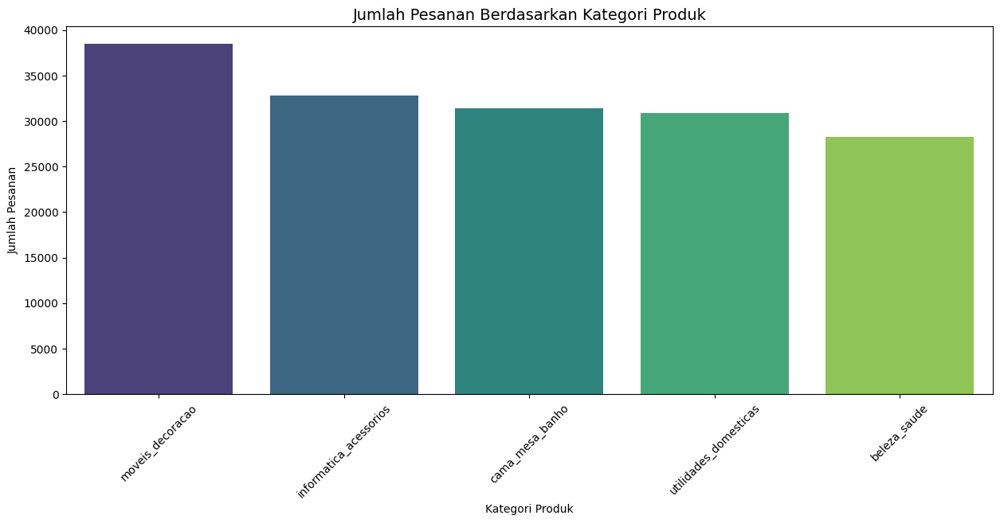

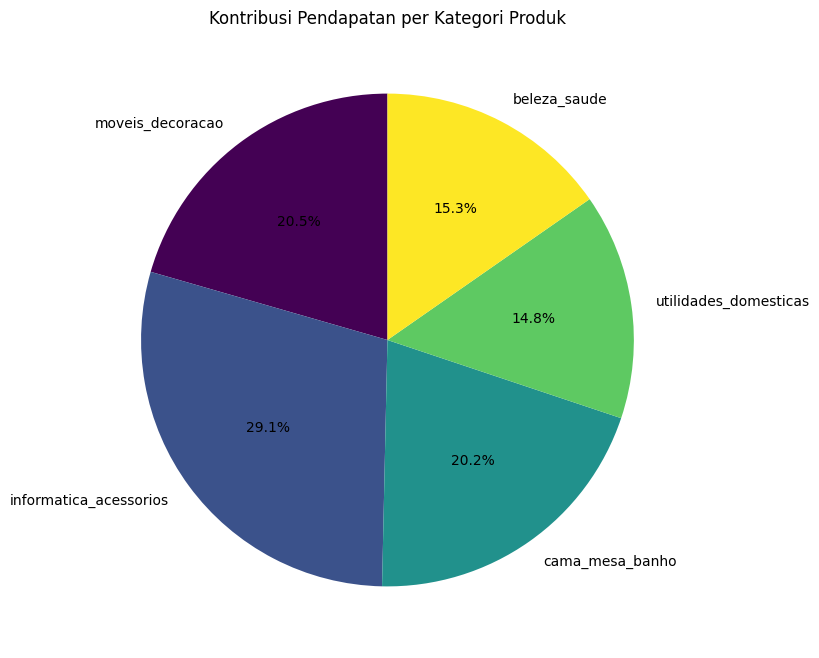

In [ ]:
product_summary = all_df.groupby('product_category_name').agg(
    total_orders=('order_id', 'count'),
    total_revenue=('price', 'sum')
).sort_values(by='total_orders', ascending=False)

top5_product_summary = product_summary.head(5)

# Bar Chart: Jumlah pesanan per kategori
plt.figure(figsize=(15, 6))
sns.barplot(
    x=top5_product_summary.index,
    y=top5_product_summary['total_orders'],
    palette="viridis"
)
plt.title("Jumlah Pesanan Berdasarkan Kategori Produk", fontsize=14)
plt.xticks(rotation=45)
plt.ylabel("Jumlah Pesanan")
plt.xlabel("Kategori Produk")
plt.show()

# Pie Chart: Kontribusi pendapatan per kategori
plt.figure(figsize=(8, 8))
top5_product_summary['total_revenue'].plot(kind='pie', autopct='%1.1f%%', colormap='viridis', startangle=90)
plt.title("Kontribusi Pendapatan per Kategori Produk")
plt.ylabel(None)
plt.show()

**Insight:**
- Semua produk yang memiliki penjualan tertinggi sudah terlihat dan produk yang paling banyak terjual adalah movies_decoracao, tetapi untuk produk yang memiliki kontribusi pendapatan adalah informatica_acessorios

### Pertanyaan 2: Apakah kecepatan pengiriman berpengaruh terhadap skor review dari customer?

<ipython-input-85-0bd1dfe7dbc8>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


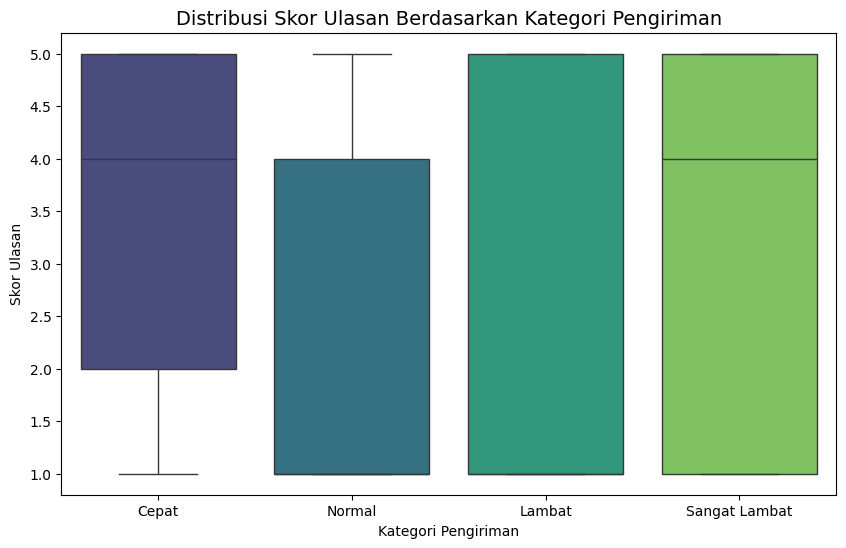

In [ ]:
max_delivery_speed = all_df['delivery_speed'].max()  # Nilai maksimum dari delivery_speed
bins = [0, 25, 50, 100, max_delivery_speed + 1]  # Tambahkan nilai maksimum + 1 ke bins
labels = ['Cepat', 'Normal', 'Lambat', 'Sangat Lambat']

# Box Plot: Skor ulasan berdasarkan kategori pengiriman
all_df['delivery_category'] = pd.cut(
    all_df['delivery_speed'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

plt.figure(figsize=(10, 6))
sns.boxplot(
    x='delivery_category',
    y='review_score',
    data=all_df,
    palette='viridis'
)
plt.title("Distribusi Skor Ulasan Berdasarkan Kategori Pengiriman", fontsize=14)
plt.xlabel("Kategori Pengiriman")
plt.ylabel("Skor Ulasan")
plt.show()


**Insight:**
- Pada kategori cepat terdapat banyak ulasan diskor tinggi dengan median di 4 tetapi juga ada beberapa yang rendah (1-2), dikategori normal sebaran ulasan berkisar di 3-5 dengan median di 4, lalu untuk kategori lambat, hampir semua ulasan berada di skor 5 dan kategori sangat lambat, sebaran ulasan berkisar di skor yang tinggi dengan median di 4.

## Analisis Lanjutan (Opsional)

**RFM**

In [ ]:
rfm_df = all_df.groupby(by="customer_id", as_index=False).agg({
    "customer": "first",
    "order_purchase_timestamp": "max", # mengambil tanggal order terakhir
    "order_id": "count", # menghitung jumlah order
    "price": "sum" # menghitung jumlah revenue yang dihasilkan
})
rfm_df.columns = ["customer_id", "customer", "max_order_timestamp", "frequency", "monetary"]

# menghitung kapan terakhir pelanggan melakukan transaksi (hari)
rfm_df["max_order_timestamp"] = rfm_df["max_order_timestamp"].dt.date
recent_date = orders_df["order_purchase_timestamp"].dt.date.max()
rfm_df["recency"] = rfm_df["max_order_timestamp"].apply(lambda x: (recent_date - x).days)

rfm_df.drop("max_order_timestamp", axis=1, inplace=True)
rfm_df.head()

,customer_id,customer,frequency,monetary,recency
0,00012a2ce6f8dcda20d059ce98491703,84791,1,89.80,288
1,000161a058600d5901f007fab4c27140,27336,1,54.90,409
2,0001fd6190edaaf884bcaf3d49edf079,63793,1,179.99,547
3,0002414f95344307404f0ace7a26f1d5,97757,1,149.90,378
4,000379cdec625522490c315e70c7a9fb,59922,1,93.00,149


<ipython-input-87-e3a92fa906b7>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="recency", x="customer", data=rfm_df.sort_values(by="recency", ascending=False).head(5), palette=colors, ax=ax[0])
<ipython-input-87-e3a92fa906b7>:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="frequency", x="customer", data=rfm_df.sort_values(by="frequency", ascending=False).head(5), palette=colors, ax=ax[1])
<ipython-input-87-e3a92fa906b7>:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(y="monetary", x="customer", data=rfm_df.sort_values(by="monetary

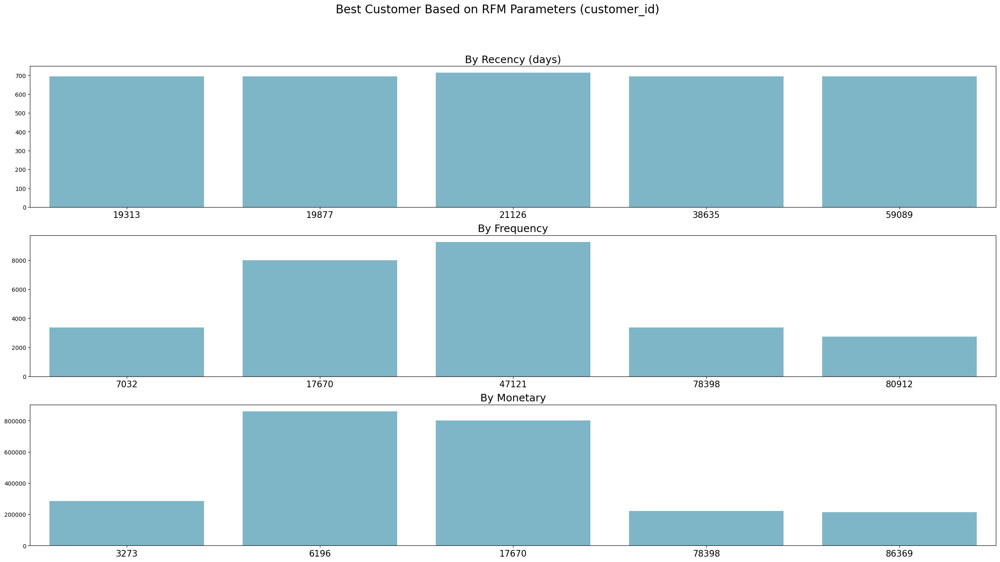

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(30, 15))

colors = ["#72BCD4", "#72BCD4", "#72BCD4", "#72BCD4", "#72BCD4"]

sns.barplot(y="recency", x="customer", data=rfm_df.sort_values(by="recency", ascending=False).head(5), palette=colors, ax=ax[0])
ax[0].set_ylabel(None)
ax[0].set_xlabel(None)
ax[0].set_title("By Recency (days)", loc="center", fontsize=18)
ax[0].tick_params(axis ='x', labelsize=15)

sns.barplot(y="frequency", x="customer", data=rfm_df.sort_values(by="frequency", ascending=False).head(5), palette=colors, ax=ax[1])
ax[1].set_ylabel(None)
ax[1].set_xlabel(None)
ax[1].set_title("By Frequency", loc="center", fontsize=18)
ax[1].tick_params(axis='x', labelsize=15)

sns.barplot(y="monetary", x="customer", data=rfm_df.sort_values(by="monetary", ascending=False).head(5), palette=colors, ax=ax[2])
ax[2].set_ylabel(None)
ax[2].set_xlabel(None)
ax[2].set_title("By Monetary", loc="center", fontsize=18)
ax[2].tick_params(axis='x', labelsize=15)

plt.suptitle("Best Customer Based on RFM Parameters (customer_id)", fontsize=20)
plt.show()

**Insight:**
- Pada kategori cepat terdapat banyak ulasan diskor tinggi dengan median di 4 tetapi juga ada beberapa yang rendah (1-2), dikategori normal sebaran ulasan berkisar di 3-5 dengan median di 4, lalu untuk kategori lambat, hampir semua ulasan berada di skor 5 dan kategori sangat lambat, sebaran ulasan berkisar di skor yang tinggi dengan median di 4.

**Geospatial Analysis**

In [ ]:
customer_loc_df = customer_loc_df.merge(all_df[['customer_id', 'seller_id', 'order_id', 'delivery_speed']], on='customer_id', how='left')
customer_loc_df.head()

,customer_city,customer_id,lat,lon,zip_code_prefix,customer,seller_id,order_id,delivery_speed
0,abadia dos dourados,9e01f714a2b3b8962c222cf2b74c20dc,-18.477752,-47.406319,38540,74530,12b9676b00f60f3b700e83af21824c0e,50ba38c4dc467baab1ea2c8c7747934d,17.0
1,abadiania,576d71ddb21b21763cfedce73b902180,-16.193718,-48.709452,72940,42308,f9244d45189d3a3605499abddeade7d5,3f1294f87d79b57f5d55ba7b80c3d94f,21.0
2,abaete,08528824266cd0720658ff01df662b6a,-19.158364,-45.446897,35620,61141,7a67c85e85bb2ce8582c35f2203ad736,5525ea8ee9e6150faa9b41dfc4024552,8.0
3,abaetetuba,305f736d2711641a06f6a9c9bd837b00,-1.723644,-48.881349,68440,11201,530ec6109d11eaaf87999465c6afee01,679783b320e587d8e1c9e0dcb2421539,18.0
4,abaiara,9723d86b12bdec025be4c43f71b0ba52,-7.355970,-39.043267,63240,69826,c003204e1ab016dfa150abc119207b24,73ffc468078b5f3e2c4260065e5e5152,23.0


In [ ]:
customerNseller_loc_df = customer_loc_df.merge(sellers_loc_df, on='seller_id', how='left')
customerNseller_loc_df.head()

,customer_city,customer_id,lat_x,lon_x,zip_code_prefix_x,customer,seller_id,order_id,delivery_speed,seller_city,lat_y,lon_y,zip_code_prefix_y,seller
0,abadia dos dourados,9e01f714a2b3b8962c222cf2b74c20dc,-18.477752,-47.406319,38540,74530,12b9676b00f60f3b700e83af21824c0e,50ba38c4dc467baab1ea2c8c7747934d,17.0,montenegro,-29.688238,-51.46873,95780.0,1025.0
1,abadiania,576d71ddb21b21763cfedce73b902180,-16.193718,-48.709452,72940,42308,f9244d45189d3a3605499abddeade7d5,3f1294f87d79b57f5d55ba7b80c3d94f,21.0,NaN,NaN,NaN,NaN,NaN
2,abaete,08528824266cd0720658ff01df662b6a,-19.158364,-45.446897,35620,61141,7a67c85e85bb2ce8582c35f2203ad736,5525ea8ee9e6150faa9b41dfc4024552,8.0,NaN,NaN,NaN,NaN,NaN
3,abaetetuba,305f736d2711641a06f6a9c9bd837b00,-1.723644,-48.881349,68440,11201,530ec6109d11eaaf87999465c6afee01,679783b320e587d8e1c9e0dcb2421539,18.0,NaN,NaN,NaN,NaN,NaN
4,abaiara,9723d86b12bdec025be4c43f71b0ba52,-7.355970,-39.043267,63240,69826,c003204e1ab016dfa150abc119207b24,73ffc468078b5f3e2c4260065e5e5152,23.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
customerNseller_loc_df.dropna(axis=0, inplace=True)

In [ ]:
customerNseller_loc_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2100 entries, 0 to 12525
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_city      2100 non-null   object 
 1   customer_id        2100 non-null   object 
 2   lat_x              2100 non-null   float64
 3   lon_x              2100 non-null   float64
 4   zip_code_prefix_x  2100 non-null   int64  
 5   customer           2100 non-null   int64  
 6   seller_id          2100 non-null   object 
 7   order_id           2100 non-null   object 
 8   delivery_speed     2100 non-null   float64
 9   seller_city        2100 non-null   object 
 10  lat_y              2100 non-null   float64
 11  lon_y              2100 non-null   float64
 12  zip_code_prefix_y  2100 non-null   float64
 13  seller             2100 non-null   float64
dtypes: float64(7), int64(2), object(5)
memory usage: 246.1+ KB


In [ ]:
customerNseller_loc_df['seller_location'] = customerNseller_loc_df.apply(lambda row: Point(row['lon_y'], row['lat_y']), axis=1)
customerNseller_loc_df['customer_location'] = customerNseller_loc_df.apply(lambda row: Point(row['lon_x'], row['lat_x']), axis=1)

# Konversi ke GeoDataFrame
gdf = gpd.GeoDataFrame(customerNseller_loc_df, geometry='seller_location', crs="EPSG:4326")
gdf['delivery_line'] = gdf.apply(lambda row: LineString([row['seller_location'], row['customer_location']]), axis=1)

m = folium.Map(location=[-34.6037, -58.3816], zoom_start=6)

# Tambahkan garis penghubung dan tampilkan kecepatan pengiriman
for _, row in gdf.iterrows():
    line = folium.PolyLine(
        locations=[
            [row['lat_y'], row['lon_y']],
            [row['lat_x'], row['lon_x']]
        ],
        color='blue' if row['delivery_speed'] <= 3 else 'red',  # Warna berdasarkan kecepatan pengiriman
        weight=3,
        tooltip=f"From: {row['seller_city']} To: {row['customer_city']} | Speed: {row['delivery_speed']} days"
    )
    line.add_to(m)

# Tambahkan marker untuk kota penjual dan pembeli
for _, row in gdf.iterrows():
    folium.Marker(
        location=[row['lat_y'], row['lon_y']],
        popup=f"Seller: {row['seller_city']}",
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(m)

    folium.Marker(
        location=[row['lat_x'], row['lon_x']],
        popup=f"Customer: {row['customer_city']}",
        icon=folium.Icon(color='green', icon='info-sign')
    ).add_to(m)

m.save('delivery_speed_map.html')
m

**Clustering**

In [ ]:
cluster_df = all_df.groupby(by="seller", as_index=False).agg({
    "order_id": "count",
    "price": "sum"
})
cluster_df.columns = ["seller", "total_orders", "total_revenue"]

cluster_df.head()

,seller,total_orders,total_revenue
0,1,4,229.50
1,2,46,12792.57
2,3,1,158.00
3,4,1,79.99
4,5,1,167.99


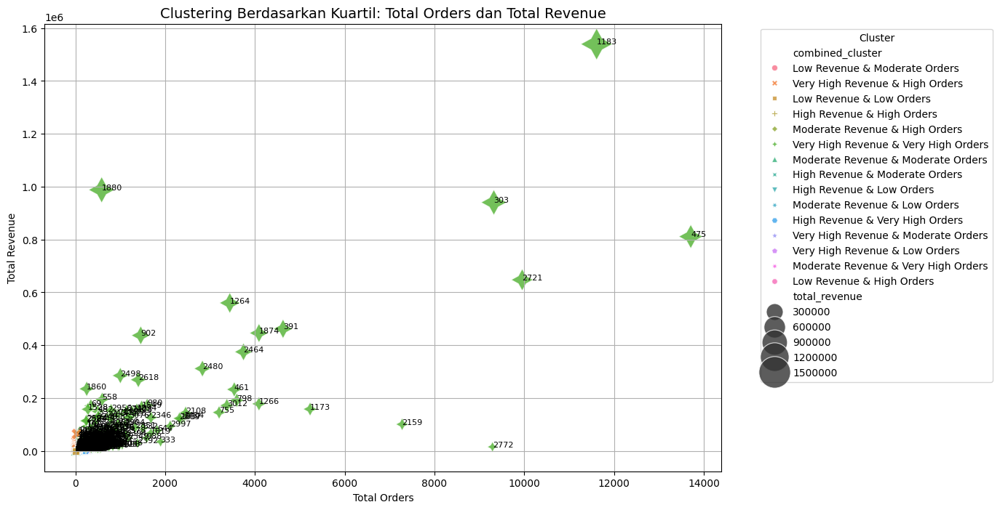

In [ ]:
# Hitung kuartil untuk total_orders dan total_revenue
q_orders = cluster_df['total_orders'].quantile([0.25, 0.5, 0.75]).to_dict()
q_revenue = cluster_df['total_revenue'].quantile([0.25, 0.5, 0.75]).to_dict()

# Fungsi clustering berdasarkan kuartil untuk total_revenue
def quartile_revenue_cluster(revenue):
    if revenue <= q_revenue[0.25]:
        return 'Low Revenue'
    elif q_revenue[0.25] < revenue <= q_revenue[0.5]:
        return 'Moderate Revenue'
    elif q_revenue[0.5] < revenue <= q_revenue[0.75]:
        return 'High Revenue'
    else:
        return 'Very High Revenue'

# Fungsi clustering berdasarkan kuartil untuk total_orders
def quartile_order_cluster(orders):
    if orders <= q_orders[0.25]:
        return 'Low Orders'
    elif q_orders[0.25] < orders <= q_orders[0.5]:
        return 'Moderate Orders'
    elif q_orders[0.5] < orders <= q_orders[0.75]:
        return 'High Orders'
    else:
        return 'Very High Orders'

# Menentukan cluster berdasarkan kuartil
cluster_df['revenue_cluster'] = cluster_df['total_revenue'].apply(quartile_revenue_cluster)
cluster_df['order_cluster'] = cluster_df['total_orders'].apply(quartile_order_cluster)

# Menggabungkan cluster kuartil
def combine_quartile_clusters(row):
    return f"{row['revenue_cluster']} & {row['order_cluster']}"

cluster_df['combined_cluster'] = cluster_df.apply(combine_quartile_clusters, axis=1)

# Visualisasi Bubble Chart
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='total_orders',
    y='total_revenue',
    size='total_revenue',  # Ukuran bubble berdasarkan total revenue
    hue='combined_cluster',  # Warna berdasarkan cluster gabungan
    data=cluster_df,
    style='combined_cluster',
    sizes=(100, 1000),  # Ukuran minimum dan maksimum bubble
    alpha=0.8
)

# Menambahkan label nama seller pada bubble
for i in range(cluster_df.shape[0]):
    plt.text(
        x=cluster_df['total_orders'].iloc[i],
        y=cluster_df['total_revenue'].iloc[i],
        s=cluster_df['seller'].iloc[i],  # Nama seller
        fontsize=8
    )

# Pengaturan plot
plt.title('Clustering Berdasarkan Kuartil: Total Orders dan Total Revenue', fontsize=14)
plt.xlabel('Total Orders')
plt.ylabel('Total Revenue')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Cluster')
plt.grid(True)
plt.show()


## Conclusion

- Conclution pertanyaan 1 -
Berdasarkan insight yang saya dapatkan, top 5 produk yang terjual paling banyak adalah movies_decoracao, informatica_accesorios, cama_mesa_banho, utilidades_domisticas, dan yang ke 5 adalah beleza_saude, tetapi disini ada insight lain yang cukup menarik pada hubungan antara penjualan produk dan kontribusi produk dalam pendapatan, yang mana produk yang terjual paling banyak belum tentu memiliki kontribusi terbanyak pada pendapatan, karena pada penjualan produk paling banyak adalah produk movies_decoracao, sedangkan produk yang memilki kontribusi pendapatan terbanyak adalah informatica_accesorios dan movies_decoracao ada di urutan ke2, yang mana ini menunjukkan bahwa produk yang paling laris tidak selalu menjadi produk yang berkontribusi pada pendapatan paling banyak, hal ini bisa disebabkan adanya faktor lain seperti harga, dan lain-lain
- Conclution pertanyaan 2 -
Berdasarkan insight yang saya dapatkan dari visualisasi boxplotnya, kecepatan pengiriman memang memengaruhi skor ulasan, tetapi sifatnya tidak absolut, karena bisa dilihat pada kategori cepat dan normal, tidak menjamin untuk mendapatkan skor tinggi yang sempurna dan pada pengiriman lambat dan sangat lambat, tetap memiliki skor ulasan yang tinggi, hal ini menunjukkan adanya faktor lain yang lebih signifikan dalam penilaian pelanggan seperti kualitas produk, komunikasi seller, dan lain-lain

**Import Data**

In [ ]:
all_df.to_csv("all_data.csv", index=False)

In [ ]:
customerNseller_loc_df.to_csv("customer_seller_loc.csv", index=False)

**Rangkuman**

Gathering Data
*   Data Customer terdapat atribut city dan state yang mana itu dapat digunakan untuk mengetahui jumlah customer pada kota/negara tersebut
*   Data Geolocation dapat digunakan untuk membuat Geospatial Analysis dari kecepatan pengiriman dari kota ke kota lain
*   Data Order Items dapat digunakan untuk mengetahui performa seller dan performa produk
*   Data Order Payment dapat digunakan untuk mengetahui tipe pembayaran apa yang sering digunakan
*   Data Order Reviews dapat digunakan untuk mengetahui rata-rata skor dari masing-masing produk dan hubungan antara kecepatan pengiriman dengan skor yang diberikan
*   Data Orders dapat digunakan untuk mengetahui kecepatan pengiriman dan pengemasan
*   Data Product Category tidak ada yang spesial pada dataset ini, hanya berisi nama kategori produk
*   Data Products dapat digunakan untuk memperjelas analisis performa dari setiap produk
*   Data Sellers dapat digunakan untuk memperjelas analisis performa seller dan untuk kecepatan pengiriman dari kota seller ke kota customer










Assesing Data
*   Data Customer tidak ada masalah pada data apapun, hanya saya tambahkan atribut customer dengan isi angka yang di increment untuk mempermudah visualisasi pada customer nanti
*   Data Geolocation terdapat banyak sekali data duplikat, dikarenakan titik lokasi setiap wilayah banyak yang mirip
*   Data Order Items terdapat kesalahan tipe data pada atribut shipping_limit_date, yang mana seharusnya datetime tapi disini tipe object
*   Data Order Payment pada atribut payment_value, terdapat nilai minimum 0.00, sepertinya hal ini disebabkan oleh pembayaran yang tidak jadi
*   Data Order Reviews terdapat missing value pada atribut review_comment_title dan review_comment_message
*   Data Orders ada kesalahan tipe data pada atribut order_purchase_timestamp, order_approved_at, order_delivered_carrier_date, order_delivered_customer_date, dan order_estimated_delivery_date yang seharusnya adalah datetime, dan terdapat missing value pada kolom order_approved_at, order_delivered_carrier_date, dan order_delivered_customer_date. Hal ini kemungkinan dikarenakan pesanan yang dilakukan, dibatalkan oleh pembeli
*   Data Product Category tidak ada masalah sama sekali pada dataset ini
*   Data Products terdapat missing value pada atribut identitas produknya, dan pada atribut product_weight_g, terdapat produk yang memiliki berat 0g
*   Data Sellers tidak ada masalah pada data ini, disini saya menambahkan atribut customer dengan isiangka yang di increment untuk mempermudah visualisasi pada seller nanti



Data Cleaning
*   Data Geolocation, masalah duplikat data berhasil diatasi walau jumlah duplikasinya cukup banyak
*   Data Order Items, tipe data sudah berhasil diubah ke datetime
*   Data Order Payment, payment_value 0.0 ini kemungkinan ini kemungkinan dikarenakan pembayaran yang tidak jadi dan hanya sedikit jumlahnya, jadi saya hapus saja untuk data yang memiliki payment_value 0.0
*   Data Orders, tipe data sudah berhasil diubah ke datetime. Untuk yang missing value, setelah saya analisa, sepertinya data-data missing value ini rata-rata adalah data pemesanan yang dibatalkan. Permasalahan missing value pada dataset orders berhasil diatasi dengan cara menghapus seluruh data missing value dikarenakan rata-rata data dari missing value ini tidak terlalu memiliki informasi penting untuk analisis nanti
*   Data Products, untuk missing valuenya saya ubah ke "empty" untuk atribut product_category_name, dan 0 untuk product_name_lenght, product_description_lenght, dan product_photos_qty



Exploratory Data Analysis (EDA)
*   Data Customer, disini saya melakukan eksplor pada jumlah customer pada masing2 city/state, dan hasilnya city/state yg memiliki customer terbanyak adalah sao paulo/SP
*   Data Geolocation, disini saya tidak melakukan eksplor apapun pada data ini, saya hanya mempersiapkan data untuk analisis geospatial nanti
*   Data Order Items, disini saya menggabungkannya dengan data product dan data seller, dan melakukan eksplor terhadap performa produk dan performa seller, dan hasilnya produk yang memiliki penjualan terbanyak adalah cama_mesa_banho, harga tertinggi adalah utilidades_domesticas, dan untuk seller yang memiliki penjualan terbanyak adalah seller ke-798, dan revenue terbanyak adalah seller ke-2618
*   Data Order Payment, disini saya melakukan eksplor pada pembayaran tertinggi, payment_type apa yang banyak digunakan dan customer rata-rata melakukan pembelian dengan berapa payment_installments, dan hasilnya pembayaran tertinggi adalah 13664.08, tipe pembayaran yang banyak digunakan adalah credit_card, dan kebanyakan customer melakukan pembayaran hanya sekali
*   Data Order Reviews, disini saya melakukan eksplor pada skor pembelian, dan hasilnya produk yang memiliki skor review tertinggi adalah cds dvd musicais tetapi memiliki total review yang sedikit yaitu 14 saja, untuk produk yang memiliki review terbanyak adalah cama mesa banho tetapi memiliki skor review yang tengah-tengah yaitu 3.9, mungkin dari penglihatan saya produk yang memiliki skor review tertinggi serta total review terbanyak adalah produk beleza saude dengan skor review 4.1 dengan total review 9645
*   Data Orders, ternyata setelah saya eksplor, terdapat masalah kemungkinan itu dikarenakan human eror atau system eror yang telat memasukkan tanggal pengiriman, tetapi hal itu sudah saya atasi dengan mengisi tanggal pengiriman yang bermasalah itu dengan tanggal pemesanan disetujui, ya kemungkinan bisa berbeda dari tanggal pengiriman yang "aslinya" tetapi mungkin tidak terlalu jauh jarak harinya, lalu disini saya sudah membuat kolom untuk melihat kecepatan pengiriman dari setiap pemesanan, dan menggabungkan data seller dan data customer sehingga saya bisa melihat rata-rata pengiriman antar kota itu berapa lama, dan setelah saya cek rata-rata pengiriman paling cepat adalah hanya beberapa jam saja tidak sampai 1 hari, dan rata-rata pengiriman paling lambat adalah 195 hari. Lalu saya juga sudah membuat untuk kolom keaktifan dari customer, dan bisa dilihat bahwa customer yang aktif jumlahnya ada 96461 dan yang tidak aktif ada 2980, yang mana bisa disimpulkan bahwa customer aktif memiliki jumlah lebih banyak daripada customer yang tidak aktif
*   Data all_df, disini saya menggabungkan data Order Items dan data Order Delivery yang mana ini adalah data hasil merge dari data Orders, Customer, Order Items, dan Seller yang berisi data-data penjualan, lalu saya menggabungkannya lagi dengan Data Order Reviews, dengan digabungkannya ini menjadi satu data, dapat menghasilkan data yang mencakup seluruh informasi pada data penjualan, disini sata melakukan eksplor untuk produk apa yang memiliki pendapatan tertinggi pada masing-masing negara, dan hasilnya adalah egara yang memiliki pembelian dengan total harga yang paling tinggi ada pada negara TO dengan benda yang terbeli dengan total harga yg tinggi adalah esporte lazer

